### DATASET

In [3]:
%pip install tensorflow
%pip install matplotlib

Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.


In [4]:
import os
import matplotlib.pyplot as plt
import tensorflow as tf

In [5]:
# Definindo e quantificando imagens de treino e validação
dataset_dir = os.path.join(os.getcwd(), "data")

dataset_train_dir = os.path.join(dataset_dir, "train")
dataset_train_fresh_len = len(os.listdir(
    os.path.join(dataset_train_dir, "fresh")))
dataset_train_half_fresh_len = len(os.listdir(
    os.path.join(dataset_train_dir, "half-fresh")))
dataset_train_spoiled_len = len(os.listdir(
    os.path.join(dataset_train_dir, "spoiled")))

dataset_validation_dir = os.path.join(dataset_dir, "valid")
dataset_validation_fresh_len = len(os.listdir(
    os.path.join(dataset_validation_dir, "fresh")))
dataset_validation_half_fresh_len = len(os.listdir(
    os.path.join(dataset_validation_dir, "half-fresh")))
dataset_validation_spoiled_len = len(os.listdir(
    os.path.join(dataset_validation_dir, "spoiled")))

print("Train Fresh: %s" % dataset_train_fresh_len)
print("Train Half-Fresh: %s" % dataset_train_half_fresh_len)
print("Train Spoiled: %s" % dataset_train_spoiled_len)

print("Validation Fresh: %s" % dataset_validation_fresh_len)
print("Validation Half-Fresh: %s" % dataset_validation_half_fresh_len)
print("Validation Spoiled: %s" % dataset_validation_spoiled_len)


Train Fresh: 675
Train Half-Fresh: 630
Train Spoiled: 510
Validation Fresh: 178
Validation Half-Fresh: 159
Validation Spoiled: 114


In [22]:
# Configurações de imagem
image_width = 416
image_height = 416
image_color_channel = 3
image_color_channel_size = 255
image_size = (image_width, image_height)
image_shape = image_size + (image_color_channel,)

# Configurações de remessas de treinamento
batch_size = 32
epochs = 20
learning_rate = 0.0001

class_name = ["fresh",  "half-fresh", "spoiled"]

In [23]:
# Configurações de treinamento
dataset_train = tf.keras.preprocessing.image_dataset_from_directory(
    dataset_train_dir,
    image_size=image_size,
    batch_size=batch_size,
    shuffle=True
)

Found 1815 files belonging to 3 classes.


In [24]:
# Configurações de validação
dataset_validation = tf.keras.preprocessing.image_dataset_from_directory(
    dataset_validation_dir,
    image_size=image_size,
    batch_size=batch_size,
    shuffle=True
)

Found 451 files belonging to 3 classes.


In [25]:
dataset_validation_cardinality = tf.data.experimental.cardinality(
    dataset_validation)
dataset_validation_batches = dataset_validation_cardinality // 5

dataset_test = dataset_validation.take(dataset_validation_batches)
dataset_validation = dataset_validation.skip(dataset_validation_batches)

print("Validation Dataset Cardinality: %d" % tf.data.experimental.cardinality(dataset_validation))
print("Test Dataset Cardinality: %d " %tf.data.experimental.cardinality(dataset_test))


Validation Dataset Cardinality: 12
Test Dataset Cardinality: 3 


In [26]:
autotune = tf.data.AUTOTUNE

dataset_train = dataset_train.prefetch(buffer_size = autotune)
dataset_validation = dataset_validation.prefetch(buffer_size = autotune)
dataset_test = dataset_validation.prefetch(buffer_size = autotune)

In [27]:
def plot_dataset(dataset):

    plt.gcf().clear()
    plt.figure(figsize = (15, 15))

    for features, labels in dataset.take(1):

        for i in range(9):

            plt.subplot(3, 3, i + 1)
            plt.axis('off')

            plt.imshow(features[i].numpy().astype('uint8'))
            plt.title(class_name[labels[i]])

<Figure size 640x480 with 0 Axes>

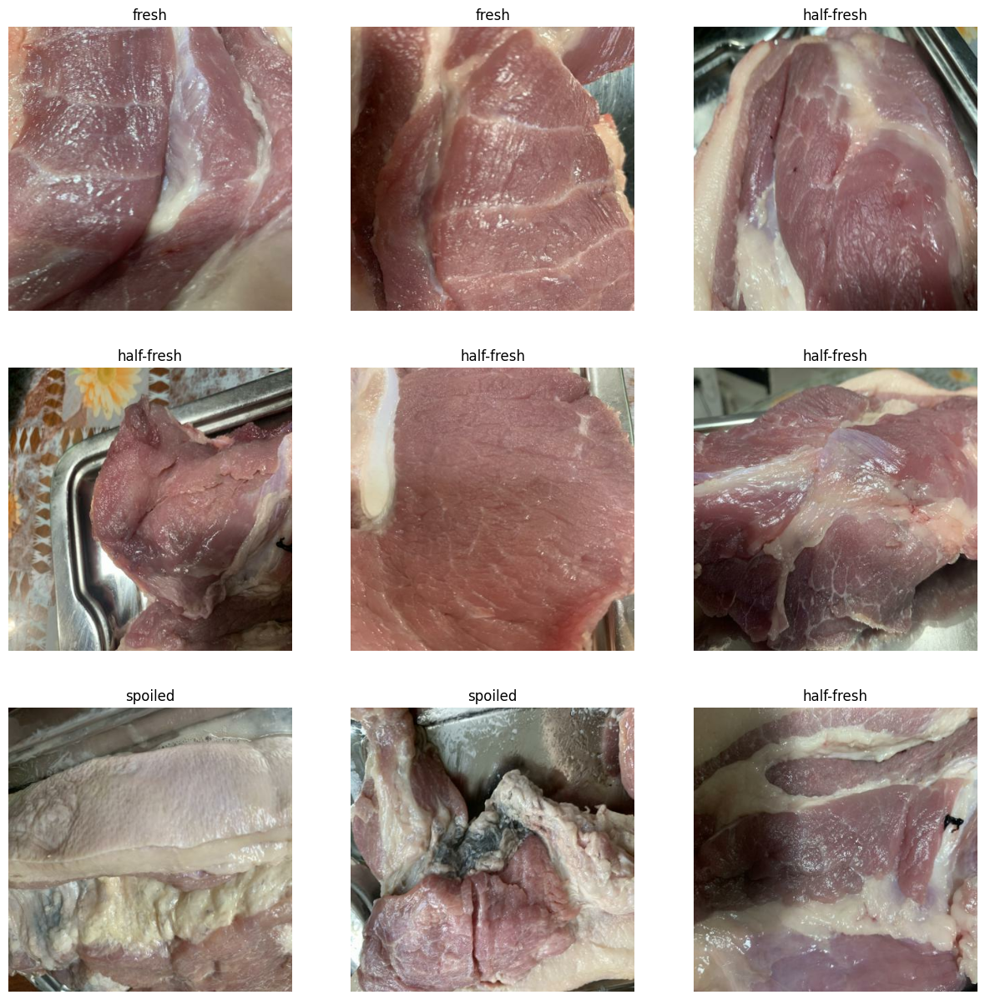

In [28]:
plot_dataset(dataset_train)

<Figure size 640x480 with 0 Axes>

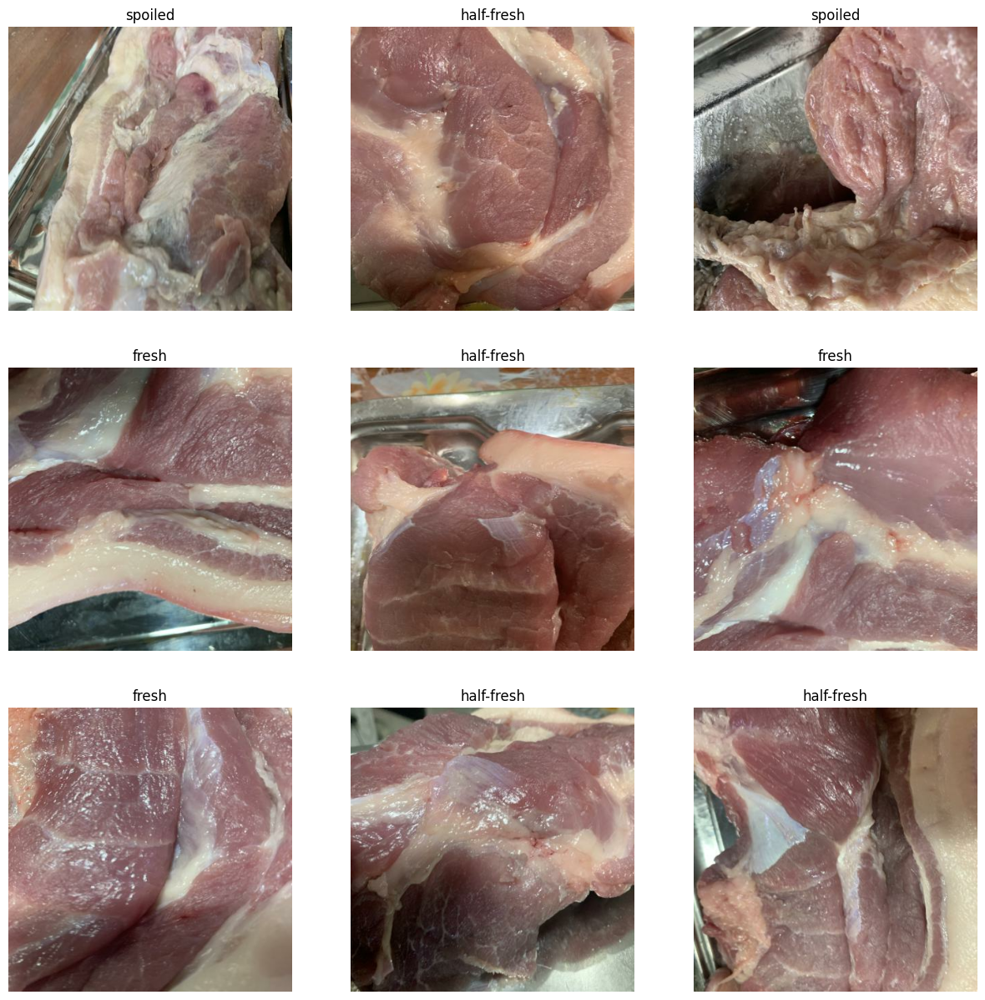

In [29]:
plot_dataset(dataset_validation)

<Figure size 640x480 with 0 Axes>

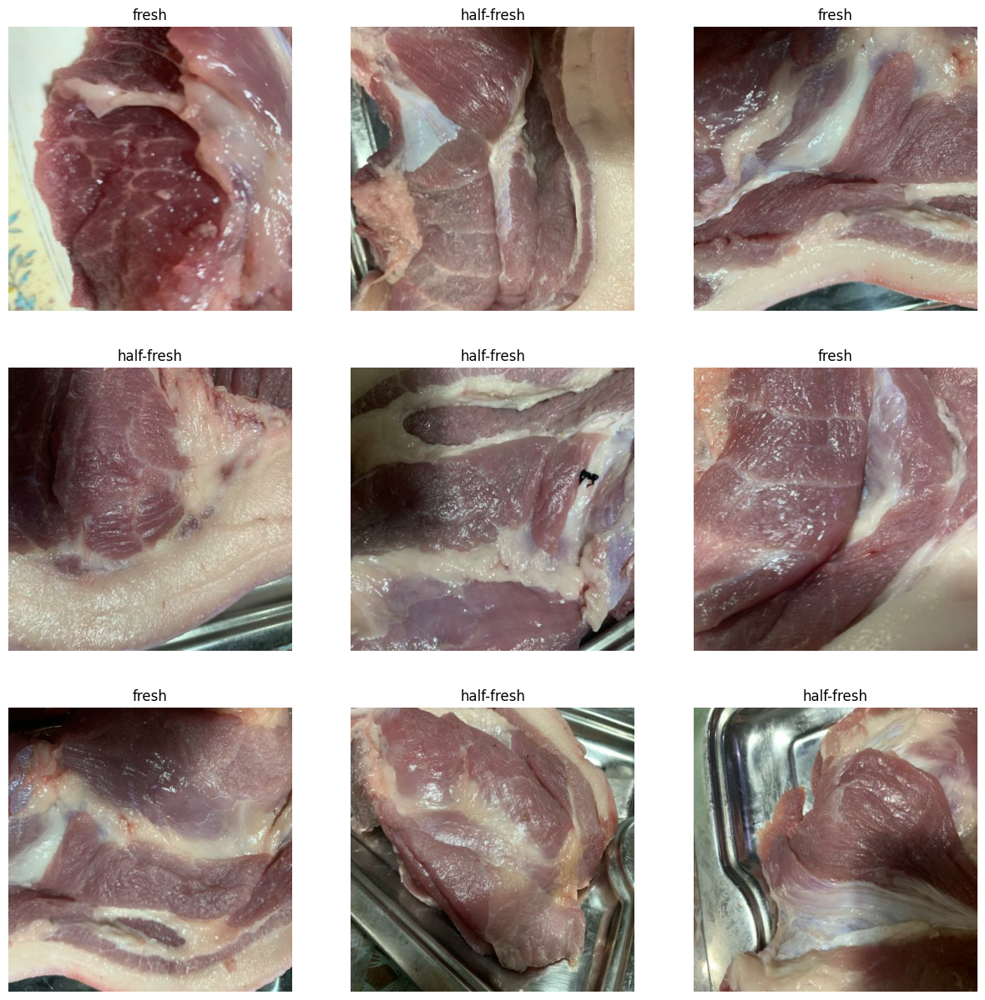

In [14]:
plot_dataset(dataset_test)

### DATA AUGMENTATION

In [31]:
data_augmentation = tf.keras.Sequential([
    tf.keras.layers.RandomFlip('horizontal'),
    tf.keras.layers.RandomRotation(0.2),
    tf.keras.layers.RandomZoom(0.2)
])


In [32]:
def plot_dataset_data_augmentation(dataset):

    plt.gcf().clear()
    plt.figure(figsize = (15, 15))

    for features, _ in dataset.take(1):

        feature = features[0]

        for i in range(9):

            feature_data_augmentation = data_augmentation(tf.expand_dims(feature, 0))

            plt.subplot(3, 3, i + 1)
            plt.axis('off')

            plt.imshow(feature_data_augmentation[0] / image_color_channel_size)

<Figure size 640x480 with 0 Axes>

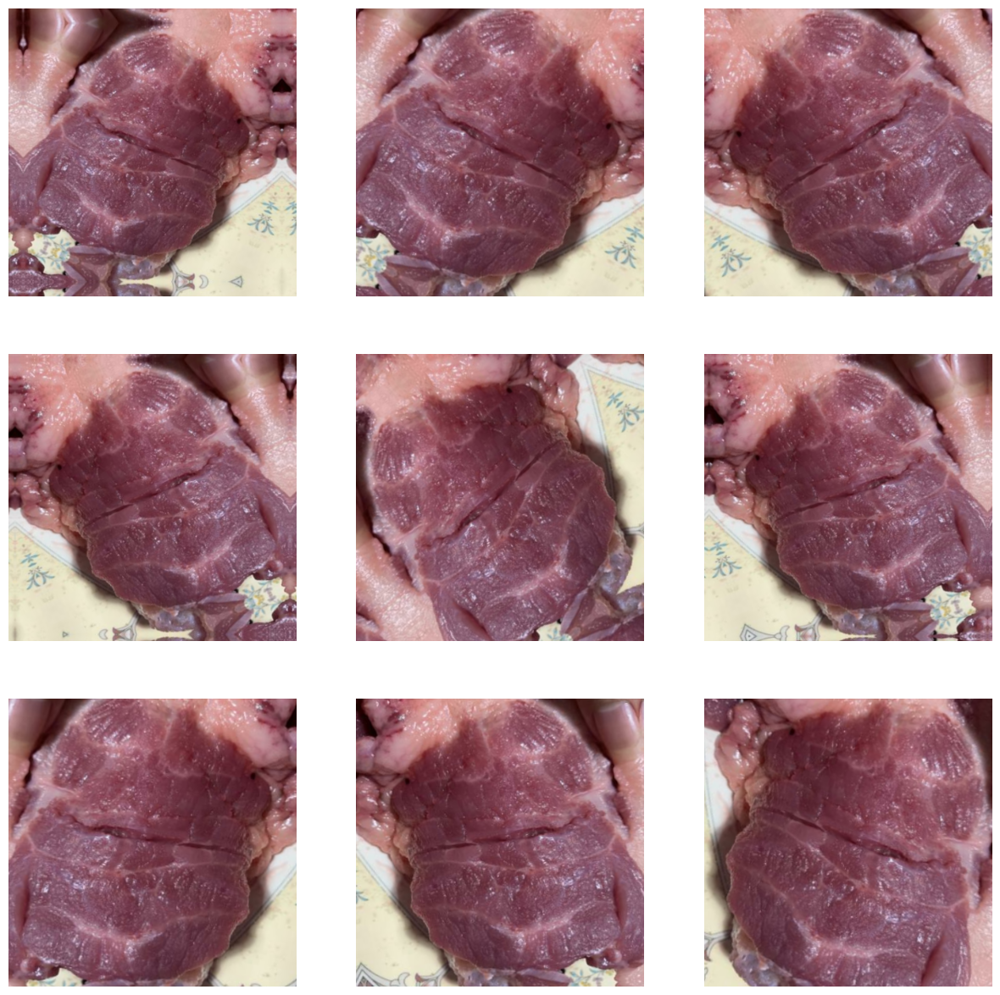

In [33]:
plot_dataset_data_augmentation(dataset_train)

### LAYER RESCALING

In [35]:
rescaling = tf.keras.layers.Rescaling(1. / (image_color_channel_size / 2.), offset = -1, input_shape = image_shape)

c:\Python\Lib\site-packages\keras\src\layers\preprocessing\tf_data_layer.py:19: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


### TRANSFER LEARNING

In [36]:
model_transfer_learning = tf.keras.applications.MobileNetV2(input_shape = image_shape, include_top = False, weights = 'imagenet')
model_transfer_learning.trainable = False

model_transfer_learning.summary()

C:\Users\lucka\AppData\Local\Temp\ipykernel_7740\3489359198.py:1: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  model_transfer_learning = tf.keras.applications.MobileNetV2(input_shape = image_shape, include_top = False, weights = 'imagenet')


9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


Model: "mobilenetv2_1.00_224"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2       │ (None, 416, 416,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1 (Conv2D)      │ (None, 208, 208,  │        864 │ input_layer_2[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_Conv1            │ (None, 208, 208,  │        128 │ Conv1[0][0]       │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1_relu (ReLU)   │ (None, 208, 208,  │          0 │ bn_Conv1[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 208, 208,  │        288 │ Conv1_relu[0][0]  │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 208, 208,  │        128 │ expanded_conv_de… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 208, 208,  │          0 │ expanded_conv_de… │
│ (ReLU)              │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 208, 208,  │        512 │ expanded_conv_de… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 208, 208,  │         64 │ expanded_conv_pr… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand      │ (None, 208, 208,  │      1,536 │ expanded_conv_pr… │
│ (Conv2D)            │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_BN   │ (None, 208, 208,  │        384 │ block_1_expand[0… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_relu │ (None, 208, 208,  │          0 │ block_1_expand_B… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_pad         │ (None, 209, 209,  │          0 │ block_1_expand_r… │
│ (ZeroPadding2D)     │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise   │ (None, 104, 104,  │        864 │ block_1_pad[0][0] │
│ (DepthwiseConv2D)   │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 104, 104,  │        384 │ block_1_depthwis… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 104, 104,  │          0 │ block_1_depthwis… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_project     │ (None, 104, 104,  │      2,304 │ block_1_depthwis

 Total params: 2,257,984 (8.61 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 2,257,984 (8.61 MB)

### EARLY STOPPING

In [37]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor = 'loss', patience = 3)

### MODEL

In [38]:
model = tf.keras.models.Sequential([
    rescaling,
    data_augmentation,
    model_transfer_learning,
    tf.keras.layers.GlobalAveragePooling2D(),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(1, activation = 'sigmoid')
])

model.compile(
    optimizer = tf.keras.optimizers.Adam(learning_rate = learning_rate),
    loss = tf.keras.losses.BinaryCrossentropy(),
    metrics = ['accuracy']
)

model.summary()

Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ rescaling (Rescaling)           │ (None, 416, 416, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential_2 (Sequential)       │ (None, 416, 416, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mobilenetv2_1.00_224            │ (None, 13, 13, 1280)   │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 1)              │         1,281 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,259,265 (8.62 MB)

 Trainable params: 1,281 (5.00 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

In [39]:
history = model.fit(
    dataset_train,
    validation_data = dataset_validation,
    epochs = epochs,
    callbacks = [
        early_stopping
    ]
)

Epoch 1/20
57/57 ━━━━━━━━━━━━━━━━━━━━ 223s 4s/step - accuracy: 0.3509 - loss: 0.5431 - val_accuracy: 0.3437 - val_loss: 0.3077
Epoch 2/20
57/57 ━━━━━━━━━━━━━━━━━━━━ 244s 4s/step - accuracy: 0.3657 - loss: 0.2606 - val_accuracy: 0.3606 - val_loss: 0.1336
Epoch 3/20
57/57 ━━━━━━━━━━━━━━━━━━━━ 249s 4s/step - accuracy: 0.3545 - loss: 0.0405 - val_accuracy: 0.3718 - val_loss: 0.0851
Epoch 4/20
57/57 ━━━━━━━━━━━━━━━━━━━━ 231s 4s/step - accuracy: 0.3692 - loss: -0.0581 - val_accuracy: 0.3549 - val_loss: -0.1631
Epoch 5/20
57/57 ━━━━━━━━━━━━━━━━━━━━ 209s 4s/step - accuracy: 0.3765 - loss: -0.2597 - val_accuracy: 0.3718 - val_loss: -0.1943
Epoch 6/20
57/57 ━━━━━━━━━━━━━━━━━━━━ 180s 3s/step - accuracy: 0.3716 - loss: -0.4034 - val_accuracy: 0.4000 - val_loss: -0.4669
Epoch 7/20
57/57 ━━━━━━━━━━━━━━━━━━━━ 167s 3s/step - accuracy: 0.3807 - loss: -0.5544 - val_accuracy: 0.4225 - val_loss: -0.4733
Epoch 8/20
57/57 ━━━━━━━━━━━━━━━━━━━━ 201s 4s/step - accuracy: 0.3898 - loss: -0.8406 - val_accuracy: 0

In [40]:
def plot_model():

    accuracy = history.history['accuracy']
    val_accuracy = history.history['val_accuracy']

    loss = history.history['loss']
    val_loss = history.history['val_loss']

    epochs_range = range(epochs)

    plt.gcf().clear()
    plt.figure(figsize = (15, 8))

    plt.subplot(1, 2, 1)
    plt.title('Training and Validation Accuracy')
    plt.plot(epochs_range, accuracy, label = 'Training Accuracy')
    plt.plot(epochs_range, val_accuracy, label = 'Validation Accuracy')
    plt.legend(loc = 'lower right')

    plt.subplot(1, 2, 2)
    plt.title('Training and Validation Loss')
    plt.plot(epochs_range, loss, label = 'Training Loss')
    plt.plot(epochs_range, val_loss, label = 'Validation Loss')
    plt.legend(loc = 'lower right')

    plt.show()

<Figure size 640x480 with 0 Axes>

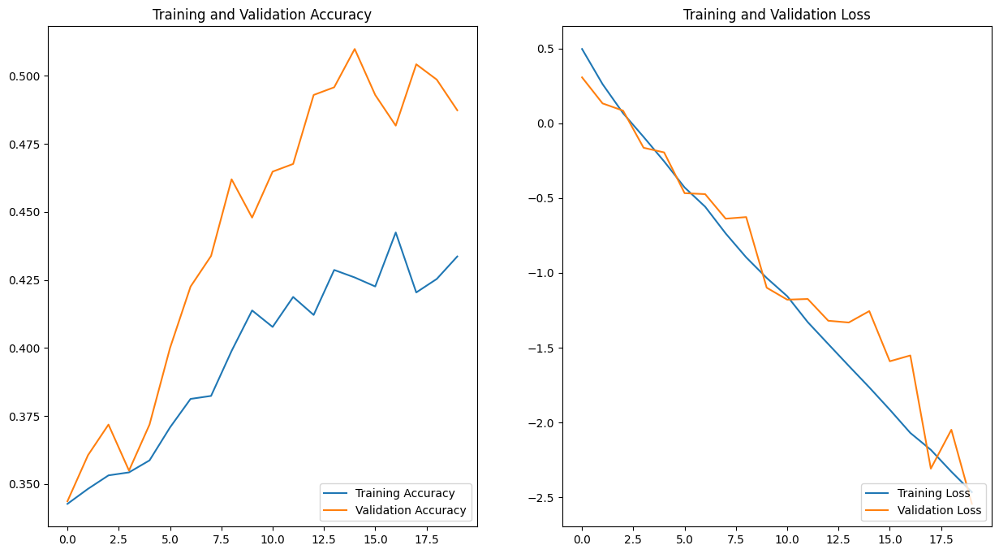

In [41]:
plot_model()

### MODEL EVALUATION

In [42]:
dataset_test_loss, dataset_test_accuracy = model.evaluate(dataset_test)

print('Dataset Test Loss:     %s' % dataset_test_loss)
print('Dataset Test Accuracy: %s' % dataset_test_accuracy)

12/12 ━━━━━━━━━━━━━━━━━━━━ 34s 3s/step - accuracy: 0.5154 - loss: -2.3709
Dataset Test Loss:     -2.3355600833892822
Dataset Test Accuracy: 0.5042253732681274


In [43]:
def plot_dataset_predictions(dataset):

    features, labels = dataset_test.as_numpy_iterator().next()

    predictions = model.predict_on_batch(features).flatten()
    predictions = tf.where(predictions < 0.5, 0, 1)

    print('Labels:      %s' % labels)
    print('Predictions: %s' % predictions.numpy())

    plt.gcf().clear()
    plt.figure(figsize = (15, 15))

    for i in range(9):

        plt.subplot(3, 3, i + 1)
        plt.axis('off')

        plt.imshow(features[i].astype('uint8'))
        plt.title(class_name[predictions[i]])

Labels:      [1 2 2 0 0 0 2 1 2 1 2 2 0 0 2 0 2 1 2 0 0 1 1 2 0 0 1 1 0 1 0 1]
Predictions: [1 1 1 0 0 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 0 1 1 1 0 0 1 1 0 1 1 1]


<Figure size 640x480 with 0 Axes>

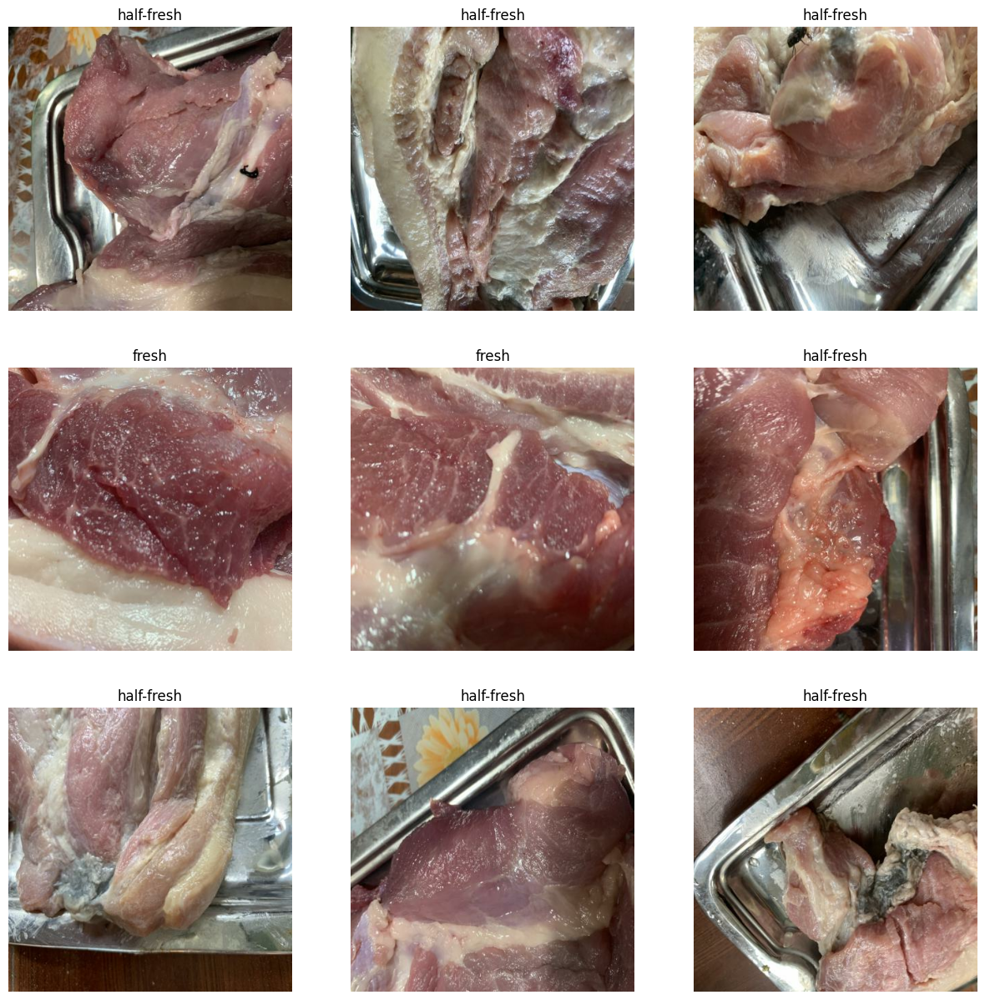

In [44]:
plot_dataset_predictions(dataset_test)

### SAVE & LOAD

In [45]:
model.save('model')

ValueError: Invalid filepath extension for saving. Please add either a `.keras` extension for the native Keras format (recommended) or a `.h5` extension. Use `tf.saved_model.save()` if you want to export a SavedModel for use with TFLite/TFServing/etc. Received: filepath=model.

In [ ]:
model = tf.keras.models.load_model('model')

### PREDICTIONS

In [ ]:
def predict(image_file):

    image = tf.keras.preprocessing.image.load_img(image_file, target_size = image_size)
    image = tf.keras.preprocessing.image.img_to_array(image)
    image = tf.expand_dims(image, 0)

    prediction = model.predict(image)[0][0]

    print('Prediction: {0} | {1}'.format(prediction, ('spoiled' if prediction < 0.5 else 'fresh')))

In [ ]:
def predict_url(image_fname, image_origin):

    image_file = tf.keras.utils.get_file(image_fname, origin = image_origin)
    return predict(image_file)

In [ ]:
predict("wagyu.jpg")

NameError: name 'predict' is not defined